# Udacity Generative AI Nanodegree - Project 4
## Personalized Real Estate Agent
* Author: Stephen Blystone
* Date: 2024-03-27

### Objective
* Create "HomeMatch", an innovative application that leverages LLMs and vector databases to transform real estate listings into personalized narratives that resonate with potential buyers' unique preferences.

### Bonus Points
* Add images and image search using CLIP to the real estate listings, and implement multi-modal search.

# Step 1: Setting up Jupyter Notebook

In [10]:
%pip install -r requirements.txt

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 12.7 MB/s eta 0:00:0000:0100:01
  Using cached pytest-3.6.0-py2.py3-none-any.whl (194 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.8/29.8 MB 20.5 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Using cached pluggy-0.6.0-py3-none-any.whl (13 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 20.4 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 23.5 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.7/310.7 kB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 22.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 19.5 MB/s eta 0:00:0000:0100:01
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit co

# Step 2: Generate Real Estate Listings

## Text for Listing

In [11]:
# # https://python.langchain.com/docs/get_started/quickstart
import os
from langchain_openai import ChatOpenAI
model_name = "gpt-3.5-turbo"
temperature = 0.0
max_tokens = 4096

# TODO: Delete before submitting
os.environ["OPENAI_API_KEY"] = "TODO:"

llm = ChatOpenAI(model_name=model_name, 
             temperature=temperature, 
             max_tokens=max_tokens)

In [12]:
# https://python.langchain.com/docs/modules/model_io/output_parsers/types/pydantic
from langchain_core.pydantic_v1 import BaseModel, Field, validator
from langchain.output_parsers import PydanticOutputParser

class TextListing(BaseModel):
    neighborhood: str = Field(description="Name of neighborhood")
    price: float = Field(description="Price of property")
    bedrooms: int = Field(description="Number of bedrooms")
    bathrooms: int = Field(description="Number of bathrooms")
    house_size: int = Field(description="Square Feet")
    description: str = Field(description="Description of property")
    neighborhood_description: str = Field(description="Description of neighborhood")


# Set up a parser + inject instructions into the prompt template.
parser = PydanticOutputParser(pydantic_object=TextListing)


In [13]:
from langchain_core.prompts import PromptTemplate
prompt = PromptTemplate(
    template="""You are an expert at creating real-estate house listings. 

{query}


Example Property Listing:

Neighborhood: Green Oaks
Price: $800,000
Bedrooms: 3
Bathrooms: 2
House Size: 2,000 sqft

Description: Welcome to this eco-friendly oasis nestled in the heart of Green Oaks. This charming 3-bedroom, 2-bathroom home boasts energy-efficient features such as solar panels and a well-insulated structure. Natural light floods the living spaces, highlighting the beautiful hardwood floors and eco-conscious finishes. The open-concept kitchen and dining area lead to a spacious backyard with a vegetable garden, perfect for the eco-conscious family. Embrace sustainable living without compromising on style in this Green Oaks gem.

Neighborhood Description: Green Oaks is a close-knit, environmentally-conscious community with access to organic grocery stores, community gardens, and bike paths. Take a stroll through the nearby Green Oaks Park or grab a cup of coffee at the cozy Green Bean Cafe. With easy access to public transportation and bike lanes, commuting is a breeze.


{format_instructions}

""",
input_variables=["query"],
partial_variables={"format_instructions": parser.get_format_instructions()},
)

print(parser.get_format_instructions())


The output should be formatted as a JSON instance that conforms to the JSON schema below.

As an example, for the schema {"properties": {"foo": {"title": "Foo", "description": "a list of strings", "type": "array", "items": {"type": "string"}}}, "required": ["foo"]}
the object {"foo": ["bar", "baz"]} is a well-formatted instance of the schema. The object {"properties": {"foo": ["bar", "baz"]}} is not well-formatted.

Here is the output schema:
```
{"properties": {"neighborhood": {"title": "Neighborhood", "description": "Name of neighborhood", "type": "string"}, "price": {"title": "Price", "description": "Price of property", "type": "number"}, "bedrooms": {"title": "Bedrooms", "description": "Number of bedrooms", "type": "integer"}, "bathrooms": {"title": "Bathrooms", "description": "Number of bathrooms", "type": "integer"}, "house_size": {"title": "House Size", "description": "Square Feet", "type": "integer"}, "description": {"title": "Description", "description": "Description of proper

In [14]:
chain = prompt | llm
results = chain.invoke({"query": "Generate 10 distinct real-estate house listings in JSON array format"})

In [15]:
import json
from langchain_core.messages.ai import AIMessage

# Parse JSON listing into Pydantic class
def parse_json_listings(llm_output: AIMessage) -> list[TextListing]:
    try:
        listings_json = json.loads(llm_output.content)
        listings = [TextListing.parse_obj(listing) for listing in listings_json]
        return listings
    except json.JSONDecodeError as e:
        print(f"Error parsing JSON: {e}")
        return []

listings = parse_json_listings(results)


In [16]:
listings

[TextListing(neighborhood='Sunnyvale Estates', price=950000.0, bedrooms=4, bathrooms=3, house_size=2500, description='Luxurious 4-bedroom, 3-bathroom home in the prestigious Sunnyvale Estates. This stunning property features high-end finishes, a gourmet kitchen, and a spacious backyard with a pool and outdoor kitchen. Perfect for entertaining guests or relaxing in style.', neighborhood_description='Sunnyvale Estates is known for its upscale homes, tree-lined streets, and proximity to top-rated schools and shopping centers.'),
 TextListing(neighborhood='Lakeview Heights', price=720000.0, bedrooms=3, bathrooms=2, house_size=2000, description='Charming 3-bedroom, 2-bathroom cottage in the desirable Lakeview Heights neighborhood. This cozy home features a fireplace, hardwood floors, and a private backyard with a deck. Enjoy peaceful living with stunning lake views.', neighborhood_description='Lakeview Heights offers a serene setting with access to hiking trails, parks, and a vibrant commun

## Images for Listing

In [17]:
# https://python.langchain.com/docs/integrations/tools/dalle_image_generator
from langchain_community.utilities.dalle_image_generator import DallEAPIWrapper
from skimage import io as skimage_io
from time import sleep
import os

# Create directory to store images, if does not already exist.
os.makedirs("imgs", exist_ok=True)

# Get images
for idx, listing in enumerate(listings, start=1):
    print(f'{idx} of {len(listings)}')
    
    image_url = DallEAPIWrapper(size="512x512").run(f"Generate a house image using description: {listing.description}")
    # Save image to disk
    image = skimage_io.imread(image_url)
    skimage_io.imsave(f'imgs/listing-{idx}.png', image)
    
    # Prevent DALL-E rate limiting
    sleep(10)


1 of 10
2 of 10
3 of 10
4 of 10
5 of 10
6 of 10
7 of 10
8 of 10
9 of 10
10 of 10


# Step 3: Store Listings in Vector Database

## Generate and store text embeddings

In [18]:
import numpy as np
from sentence_transformers import SentenceTransformer
from typing import Union

MODEL_NAME = 'paraphrase-MiniLM-L6-v2'

def generate_embeddings(input_data: Union[str, list[str]]) -> np.ndarray:    
    model = SentenceTransformer(MODEL_NAME)
    embeddings = model.encode(input_data)
    return embeddings

In [19]:
text_embeddings = generate_embeddings([
    f"{l.description} {l.neighborhood_description}" for l in listings
])

In [20]:
text_embeddings.shape

(10, 384)

## Generate and store image embeddings

In [22]:
import io
import PIL
import lancedb
from lancedb.pydantic import LanceModel, vector


# Define PropertyListing here so the image embedding has access to the helper methods

class PropertyListing(LanceModel):
    image_vector: vector(512) = Field(description="Embedding vector for image") # CLIP produces 512D vector fields
    image: bytes = Field(description="Image bytes")
    text_vector: vector(text_embeddings.shape[1]) = Field(description="Embedding vector for text")
    neighborhood: str = Field(description="Name of neighborhood")
    price: float = Field(description="Price of property")
    bedrooms: int = Field(description="Number of bedrooms")
    bathrooms: int = Field(description="Number of bathrooms")
    size: int = Field(description="Square Feet")
    description: str = Field(description="Description of property")
    neighborhood_description: str = Field(description="Description of neighborhood")
    
    # Open home images
    def to_pil(self):
        return PIL.Image.open(io.BytesIO(self.image))
    
    @classmethod
    def file_to_bytes(cls, path: str) -> bytes:
        with open(path, 'rb') as img_file:
            img_bytes = img_file.read()
        return img_bytes


In [23]:
from transformers import CLIPModel, CLIPProcessor

MODEL_ID = "openai/clip-vit-base-patch32"

device = "cpu"

clip_model = CLIPModel.from_pretrained(MODEL_ID).to(device)
processor = CLIPProcessor.from_pretrained(MODEL_ID)

In [24]:
from torch import FloatTensor

def process_image(image: np.ndarray) -> FloatTensor:
    image = processor(text=None, images=image, return_tensors="pt")[
        "pixel_values"
    ].to(device)
    
    # create the image embedding from the processed image and the model
    img_emb = clip_model.get_image_features(image)

    embedding = img_emb.cpu().tolist()[0]
    return embedding

In [25]:
image_embeddings = []
image_bytes = []

for idx, listing in enumerate(listings, start=1):
    print(f'{idx} of {len(listings)}')
    img_file = f'imgs/listing-{idx}.png'
    img_byte = PropertyListing.file_to_bytes(img_file)
    image_bytes.append(img_byte)
    image = skimage_io.imread(img_file)
    embedding = process_image(image)
    image_embeddings.append(embedding)

1 of 10
2 of 10
3 of 10
4 of 10
5 of 10
6 of 10
7 of 10
8 of 10
9 of 10
10 of 10


In [29]:
len(image_embeddings[0])

512

## Vector Database Setup

In [30]:
# Create Vector DB
TABLE_NAME = "listings"
db = lancedb.connect("./.lancedb")
db.drop_table(TABLE_NAME, ignore_missing=True)
table = db.create_table(TABLE_NAME, schema=PropertyListing)

In [31]:
# Add data to LanceDB
property_list = []
for listing, txt_emb, img_emb, img_bytes in zip(listings, text_embeddings, image_embeddings, image_bytes):
    property_list.append(PropertyListing(
        image_vector=img_emb,
        image=img_bytes,
        text_vector=txt_emb,
        neighborhood=listing.neighborhood,
        price=listing.price,
        bedrooms=listing.bedrooms,
        bathrooms=listing.bathrooms,
        size=listing.house_size,
        description=listing.description,
        neighborhood_description=listing.neighborhood_description
    ))

table.add([dict(d) for d in property_list])

In [47]:
# Helper dictionary to map neighborhood to PropertyListing
listings_dict = {t.neighborhood: t for t in property_list}

for n in listings_dict.keys():
    print(f'{n} ||| {listings_dict[n].bedrooms} ||| {listings_dict[n].description} ||| {listings_dict[n].neighborhood_description}')

Sunnyvale Estates ||| 4 ||| Luxurious 4-bedroom, 3-bathroom home in the prestigious Sunnyvale Estates. This stunning property features high-end finishes, a gourmet kitchen, and a spacious backyard with a pool and outdoor kitchen. Perfect for entertaining guests or relaxing in style. ||| Sunnyvale Estates is known for its upscale homes, tree-lined streets, and proximity to top-rated schools and shopping centers.
Lakeview Heights ||| 3 ||| Charming 3-bedroom, 2-bathroom cottage in the desirable Lakeview Heights neighborhood. This cozy home features a fireplace, hardwood floors, and a private backyard with a deck. Enjoy peaceful living with stunning lake views. ||| Lakeview Heights offers a serene setting with access to hiking trails, parks, and a vibrant community atmosphere.
Mountain Ridge ||| 5 ||| Spacious 5-bedroom, 4-bathroom home in the exclusive Mountain Ridge community. This elegant property boasts a grand foyer, gourmet kitchen, home theater, and a landscaped backyard with a fir

In [33]:
table.head().to_pandas()

,image_vector,image,text_vector,neighborhood,price,bedrooms,bathrooms,size,description,neighborhood_description
0,"[0.22864185, 0.3471542, 0.04503866, -0.3291479...",b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,"[0.3745919, 0.2299004, 0.019183604, -0.0780087...",Sunnyvale Estates,950000.0,4,3,2500,"Luxurious 4-bedroom, 3-bathroom home in the pr...",Sunnyvale Estates is known for its upscale hom...
1,"[0.08170573, 0.2359791, -0.37829018, 0.0490565...",b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,"[0.27740812, -0.15096739, 0.023561992, 0.26980...",Lakeview Heights,720000.0,3,2,2000,"Charming 3-bedroom, 2-bathroom cottage in the ...",Lakeview Heights offers a serene setting with ...
2,"[0.26523912, 0.04619515, -0.10379173, -0.22226...",b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,"[0.26481947, 0.15717496, -0.14391774, 0.173379...",Mountain Ridge,850000.0,5,4,3500,"Spacious 5-bedroom, 4-bathroom home in the exc...",Mountain Ridge is a prestigious neighborhood k...
3,"[-0.17323697, 0.08831238, -0.1749723, 0.021169...",b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,"[0.4637277, -0.007399818, 0.20044012, -0.00334...",Harbor Pointe,680000.0,3,2,1800,"Modern 3-bedroom, 2-bathroom townhouse in the ...",Harbor Pointe offers a waterfront lifestyle wi...
4,"[-0.25090122, 0.3268281, -0.13610464, 0.205249...",b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\...,"[0.31469867, -0.23511876, -0.011303771, 0.3831...",Pinecrest Meadows,780000.0,4,3,2200,"Inviting 4-bedroom, 3-bathroom ranch-style hom...",Pinecrest Meadows is a quiet community surroun...


In [34]:
# NOTE: No index needed since we only have 10 entries

# Step 4: Build User Preference Interface

## Collect Buyer Preferences

In [35]:
# Collect information from the user
personal_questions = [
    "How big do you want your house to be?" 
    "What are 3 most important things for you in choosing this property?", 
    "Which amenities would you like?", 
    "Which transportation options are important to you?",
    "How urban do you want your neighborhood to be?",  
]

# Uncomment this to interactively get answers.
# personal_answers = [ ] 
# for question in personal_questions:
#    answer = input(question)
#    personal_answers.append(answer)

personal_answers = [
    "A comfortable three-bedroom house with a spacious kitchen and a cozy living room.",
    "A quiet neighborhood, good local schools, and convenient shopping options.",
    "A backyard for gardening, a two-car garage, and a modern, energy-efficient heating system.",
    "Easy access to a reliable bus line, proximity to a major highway, and bike-friendly roads.",
    "A balance between suburban tranquility and access to urban amenities like restaurants and theaters."
]

## Buyer Preference Parsing

In [36]:
# Generate embeddings for buyer preferences.

# Combine all answers together, since they are all relevant in searching for a home.
buyer_preferences = ' '.join(personal_answers)
buyer_preference_embeddings = generate_embeddings(buyer_preferences)
buyer_preference_embeddings.shape

(384,)

# Step 5: Searching Based on Preferences

## Semantic Search Implementation

In [40]:
# Search using L2 distance
table.search(buyer_preference_embeddings, vector_column_name="text_vector").to_pandas()[['neighborhood', 'bedrooms', 'description', 'neighborhood_description']]

,neighborhood,bedrooms,description,neighborhood_description
0,Harbor Pointe,3,"Modern 3-bedroom, 2-bathroom townhouse in the ...",Harbor Pointe offers a waterfront lifestyle wi...
1,Oakwood Grove,5,"Stunning 5-bedroom, 4-bathroom estate in the p...",Oakwood Grove is an exclusive neighborhood kno...
2,Pinecrest Meadows,4,"Inviting 4-bedroom, 3-bathroom ranch-style hom...",Pinecrest Meadows is a quiet community surroun...
3,Sunnyvale Estates,4,"Luxurious 4-bedroom, 3-bathroom home in the pr...",Sunnyvale Estates is known for its upscale hom...
4,Riverfront Estates,6,"Magnificent 6-bedroom, 5-bathroom waterfront h...",Riverfront Estates offers a tranquil setting w...
5,Hilltop Heights,4,"Modern 4-bedroom, 3-bathroom hilltop home in t...",Hilltop Heights offers a vibrant urban lifesty...
6,Mountain Ridge,5,"Spacious 5-bedroom, 4-bathroom home in the exc...",Mountain Ridge is a prestigious neighborhood k...
7,Lakeview Heights,3,"Charming 3-bedroom, 2-bathroom cottage in the ...",Lakeview Heights offers a serene setting with ...
8,Sunset Ridge,4,"Spacious 4-bedroom, 3-bathroom family home in ...",Sunset Ridge offers a tranquil setting with ac...
9,Meadowbrook Village,3,"Cozy 3-bedroom, 2-bathroom bungalow in the cha...",Meadowbrook Village is a close-knit community ...


In [41]:
# Search using cosine distance for comparison
table.search(buyer_preference_embeddings, vector_column_name="text_vector").metric("cosine").to_pandas()[['neighborhood', 'bedrooms', 'description', 'neighborhood_description']]

,neighborhood,bedrooms,description,neighborhood_description
0,Pinecrest Meadows,4,"Inviting 4-bedroom, 3-bathroom ranch-style hom...",Pinecrest Meadows is a quiet community surroun...
1,Harbor Pointe,3,"Modern 3-bedroom, 2-bathroom townhouse in the ...",Harbor Pointe offers a waterfront lifestyle wi...
2,Hilltop Heights,4,"Modern 4-bedroom, 3-bathroom hilltop home in t...",Hilltop Heights offers a vibrant urban lifesty...
3,Oakwood Grove,5,"Stunning 5-bedroom, 4-bathroom estate in the p...",Oakwood Grove is an exclusive neighborhood kno...
4,Meadowbrook Village,3,"Cozy 3-bedroom, 2-bathroom bungalow in the cha...",Meadowbrook Village is a close-knit community ...
5,Lakeview Heights,3,"Charming 3-bedroom, 2-bathroom cottage in the ...",Lakeview Heights offers a serene setting with ...
6,Sunnyvale Estates,4,"Luxurious 4-bedroom, 3-bathroom home in the pr...",Sunnyvale Estates is known for its upscale hom...
7,Riverfront Estates,6,"Magnificent 6-bedroom, 5-bathroom waterfront h...",Riverfront Estates offers a tranquil setting w...
8,Sunset Ridge,4,"Spacious 4-bedroom, 3-bathroom family home in ...",Sunset Ridge offers a tranquil setting with ac...
9,Mountain Ridge,5,"Spacious 5-bedroom, 4-bathroom home in the exc...",Mountain Ridge is a prestigious neighborhood k...


In [42]:
# Print the top 3 properties for each buyer preference
for ans, pref_emb in zip(personal_answers, [generate_embeddings(ans) for ans in personal_answers]):
    print(ans)
    print("L2 distance:")
    print(table.search(pref_emb, vector_column_name="text_vector").limit(3).to_pandas()[['neighborhood', 'bedrooms', 'description', 'neighborhood_description']])
    print("Cosine distance:")
    print(table.search(pref_emb, vector_column_name="text_vector").metric("cosine").limit(3).to_pandas()[['neighborhood', 'bedrooms', 'description', 'neighborhood_description']])
    print("==================================")

A comfortable three-bedroom house with a spacious kitchen and a cozy living room.
L2 distance:
        neighborhood  bedrooms  \
0      Harbor Pointe         3   
1  Pinecrest Meadows         4   
2      Oakwood Grove         5   

                                         description  \
0  Modern 3-bedroom, 2-bathroom townhouse in the ...   
1  Inviting 4-bedroom, 3-bathroom ranch-style hom...   
2  Stunning 5-bedroom, 4-bathroom estate in the p...   

                            neighborhood_description  
0  Harbor Pointe offers a waterfront lifestyle wi...  
1  Pinecrest Meadows is a quiet community surroun...  
2  Oakwood Grove is an exclusive neighborhood kno...  
Cosine distance:
        neighborhood  bedrooms  \
0      Harbor Pointe         3   
1  Pinecrest Meadows         4   
2      Oakwood Grove         5   

                                         description  \
0  Modern 3-bedroom, 2-bathroom townhouse in the ...   
1  Inviting 4-bedroom, 3-bathroom ranch-style hom...   
2

Given this comparison and the buyer preferences, the cosine metric seems to be better for this use case.

## Listing Retrieval Logic

In [48]:
from typing import List

# Return the 5 most relevant searches and corresponding 
def retrieve_most_relevant_properties(query_embeddings: str, limit=5) -> List[dict]:
    neighborhoods = list(table.search(query_embeddings, vector_column_name="text_vector").metric("cosine").limit(limit).to_pandas()[['neighborhood']].to_dict()['neighborhood'].values())
    return [listings_dict[n] for n in neighborhoods]


In [49]:
# Test retrieve_most_relevant_properties
most_relevant_properties = retrieve_most_relevant_properties(buyer_preference_embeddings)
most_relevant_properties

[PropertyListing(image_vector=FixedSizeList(dim=512), image=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02\x00\x00\x00\x02\x00\x08\x02\x00\x00\x00{\x1aC\xad\x00\x01\x00\x00IDATx\x9cT\xfdg\xb3eYr%\x88-\xf7\xbd\x8f\xba\xfa\xc9\x90\x19\x99\x95\xa2\xaa\xb2\nU\xd0\xe8n\x0c\xd0\xdd3c\xd64\x9a\r>\x906?\x81\x7f\x89\xfc\x07\xfc\x01\x14F#i\x9c\x9e\xee\x9e\x1eBu\x17\x80\xd2H\x9d!2\xc4\x8b\'\xaf:bow~p?7\x8a0C\x15\x90\x19\xf1\xde\xbd\xe7\xec\xedb\xad\xe5\xcb\xe9\xe7\x7f\xf7\x9f\x00%"U%\x11Q\x11\xa8\x8a\xe4,\xaaB\x92\xb3\xaa\x8a\x88d0\x08\x80(Q`\x80\x02#\x10\x11E\x8a`\x16\x0511\x18\xa4\x00\x93jV0\x13\x00\x80H\xa1\x04\x10\x18P\x11\x90\x82\xec_))A\xb3\x80H\x85\xc0\xf6g\x00\xa8\xfd/\x11\xb1v\xed.\xf7\xfb\xb2\xac\xaafv|\xefq3\x99\xadon\xb6wW\x92\x07\xd2D\xf6\xe3)\x90\x12\x91\xfdz\x00\x04\x08\x13\x03\x00))\x88AP\x90\x10\x91\x8a\x04\n\x80@3\x021\x82*1\xa9\x7f|\x15p`\x05\xd4>\x11\x18\x10\x08)(@E\x99\x88\x01\x10\x81\x94\x11\x14B\x01,P\x10Q\x80f\x10\t\xc0\xe3_!\r U\x05X\xa1\xaa\n&\x02\xa0 f\x82\x00L \x02\

# Step 6: Personalizing Listing Descriptions

## LLM Augmentation

In [50]:
class AugmentedDescriptions(BaseModel):
    aug_description: str = Field(description="LLM Augmented Description of property")
    aug_neighborhood_description: str = Field(description="LLM Augmented Description of neighborhood")


# Set up a parser + inject instructions into the prompt template.
aug_parser = PydanticOutputParser(pydantic_object=AugmentedDescriptions)

In [69]:
aug_prompt = PromptTemplate(
    template="""You are an expert at creating real-estate house listings that does not change the number of bedrooms.

Rewrite the existing property description and the existing neighborhood description to appeal to the buyer's preferences.
DO NOT CHANGE THE NUMBER OF BEDROOMS FROM THE EXISTING DESCRIPTIONS.
AND DO NOT CHANGE THE NUMBER OF BATHROOMS FROM THE EXISTING DESCRIPTIONS.


These are the most important things to the buyer:

{buyer_preferences}


This is the existing property description:
{existing_description}


This is the existing neighborhood description:
{existing_neighborhood}



It is imperative you maintain factual accuracy with the existing property description and existing neighborhood description.
Make sure the number of bathrooms match between the existing property description and your new version.
Make sure the number of bedrooms match between the existing property description and your new version.



{format_instructions}

""",
input_variables=["buyer_preferences", "existing_description", "existing_neighborhood"],
partial_variables={"format_instructions": aug_parser.get_format_instructions()},
)

chain = aug_prompt | llm

In [70]:
def parse_aug_json_listings(llm_output: AIMessage) -> AugmentedDescriptions:
    try:
        listings_json = json.loads(llm_output.content)
        aug_listing = AugmentedDescriptions.parse_obj(listings_json)
        return aug_listing
    except json.JSONDecodeError as e:
        print(f"Error parsing JSON: {e}")
        return []


In [83]:
import re

bedroomRE = re.compile('(\d+\-bedroom)')
bathroomRE = re.compile('(\d+\-bathroom)')

# Pass in buyer's preferences and get back personalized listings
def generate_personalized_listings(preferences: list) -> list:
    personalized_listings = []

    embeddings = generate_embeddings(' '.join(preferences))
    most_relevant_properties = retrieve_most_relevant_properties(embeddings)

    for prop in most_relevant_properties:
        results = chain.invoke({
            "buyer_preferences": " ".join(personal_answers),
            "existing_description": prop.description,
            "existing_neighborhood": prop.neighborhood_description})
        aug_listing = parse_aug_json_listings(results)

        augDescription = aug_listing.aug_description

        # Check if number of bedrooms match
        existingBedrooms = re.search(bedroomRE, prop.description)
        newBedrooms = re.search(bedroomRE, augDescription)

        if existingBedrooms is not None and newBedrooms is not None:
            existingBedroomStr = existingBedrooms.group(1)
            newBedroomsStr = newBedrooms.group(1)
            if existingBedroomStr == newBedroomsStr:
                # print("number of bedrooms match")
                pass
            else:
                # print(f"number of bedrooms do not match. Replacing {newBedroomsStr} with {existingBedroomStr}")
                # Modify augDescription to update with correct value
                augDescription = augDescription.replace(newBedroomsStr, existingBedroomStr)
        else:
            # print("Could not find bedroom value")
            pass

        # Check if number of bathrooms match
        existingBathrooms = re.search(bathroomRE, prop.description)
        newBathrooms = re.search(bathroomRE, augDescription)

        if existingBathrooms is not None and newBathrooms is not None:
            existingBathroomStr = existingBathrooms.group(1)
            newBathroomsStr = newBathrooms.group(1)
            if existingBathroomStr == newBathroomsStr:
                # print("number of bathrooms match")
                pass
            else:
                # print(f"number of bathrooms do not match. Replacing {newBathroomsStr} with {existingBathroomStr}")
                # Modify augDescription to update with correct value
                augDescription = augDescription.replace(newBathroomsStr, existingBathroomStr)
        else:
            # print("Could not find bathroom value")
            pass


        personalized_listings.append(
            PropertyListing(
                image_vector = prop.image_vector,
                image = prop.image,
                text_vector = prop.text_vector,
                neighborhood = prop.neighborhood,
                price = prop.price,
                bedrooms = prop.bedrooms,
                bathrooms = prop.bathrooms,
                size = prop.size,
                description = augDescription,
                neighborhood_description = aug_listing.aug_neighborhood_description
            )
        )
        # print(f"{prop.neighborhood}")
        # print(f"Old desc: {prop.description}")
        # print(f"New desc: {augDescription}")
        # print(f"Old neighborhood desc: {prop.neighborhood_description}")
        # print(f"New neighborhood desc: {aug_listing.aug_neighborhood_description}")
        # print("====")
    return personalized_listings

personalized_listings = generate_personalized_listings(personal_answers)

Greetings! Based on your preferences, here are some properties we think you would enjoy:
===== PROPERTY 1 =====
Neighborhood: Riverfront Estates
Price: $1050000.0
Bedrooms: 6
Bathrooms: 5
Property Size: 4000

Description: Comfortable 6-bedroom, 5-bathroom waterfront home in the prestigious Riverfront Estates community. This elegant property features a private dock, panoramic river views, a wine cellar, and a home gym. Perfect for those seeking luxury living on the water. The house also boasts a spacious kitchen, cozy living room, backyard for gardening, two-car garage, and a modern, energy-efficient heating system.

Neighborhood Description: Riverfront Estates offers a tranquil setting with access to boating, fishing, and waterfront dining. Experience the beauty of riverfront living in this exclusive enclave. The neighborhood is known for its quiet atmosphere, good local schools, and convenient shopping options. It also provides easy access to a reliable bus line, proximity to a major 

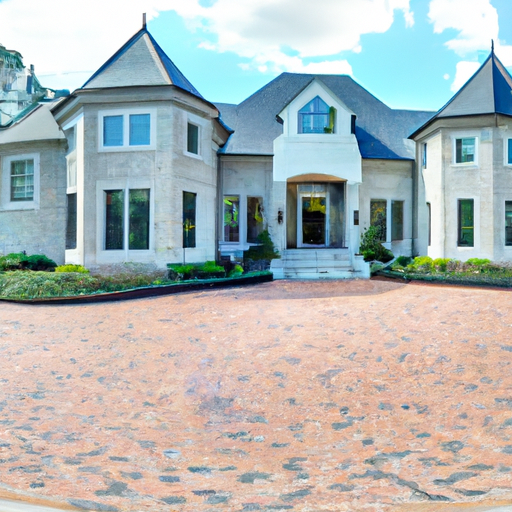

===== PROPERTY 2 =====
Neighborhood: Harbor Pointe
Price: $680000.0
Bedrooms: 3
Bathrooms: 2
Property Size: 1800

Description: Stylish 3-bedroom, 2-bathroom townhouse in the desirable Harbor Pointe community. This home boasts an open floor plan, high-end finishes, and a rooftop terrace with stunning water views. Experience coastal living at its best with modern amenities and a comfortable layout perfect for entertaining.

Neighborhood Description: Harbor Pointe offers a serene waterfront lifestyle with marinas, dining options, and scenic walking paths along the harbor. Enjoy the beauty of coastal living while being just a short distance from local schools, shopping centers, and easy access to transportation options for a convenient and balanced suburban-urban lifestyle.



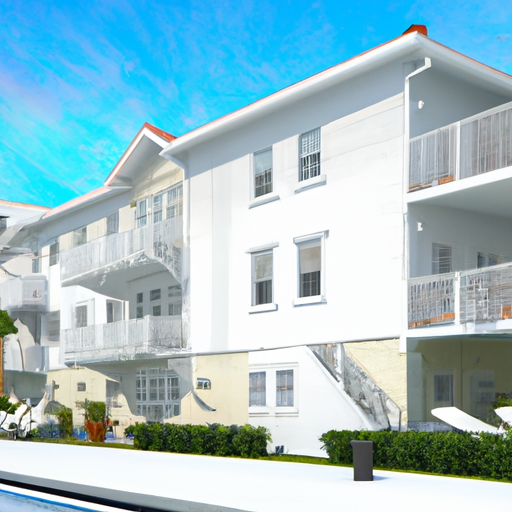

===== PROPERTY 3 =====
Neighborhood: Pinecrest Meadows
Price: $780000.0
Bedrooms: 4
Bathrooms: 3
Property Size: 2200

Description: Inviting 4-bedroom, 3-bathroom ranch-style home in the peaceful Pinecrest Meadows neighborhood. This charming property features a sunroom, hardwood floors, and a large backyard with a garden. Perfect for those seeking a tranquil retreat. The spacious kitchen and cozy living room provide a comfortable living space, while the two-car garage and modern, energy-efficient heating system add convenience and efficiency.

Neighborhood Description: Pinecrest Meadows is a quiet community surrounded by nature trails, parks, and wildlife. Enjoy a serene lifestyle in this picturesque neighborhood with good local schools and convenient shopping options. The neighborhood offers easy access to a reliable bus line, proximity to a major highway, and bike-friendly roads. Residents can enjoy a balance between suburban tranquility and access to urban amenities like restaurants 

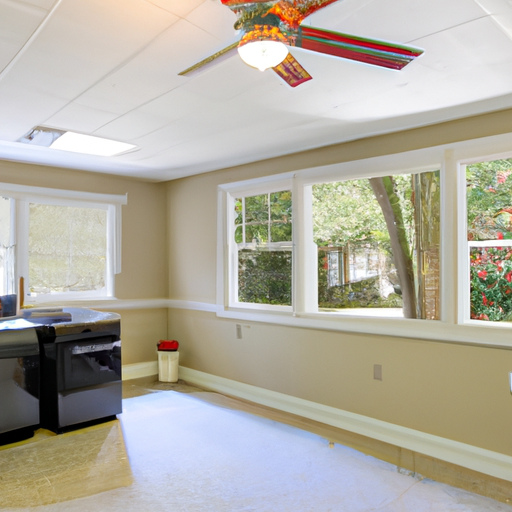

===== PROPERTY 4 =====
Neighborhood: Lakeview Heights
Price: $720000.0
Bedrooms: 3
Bathrooms: 2
Property Size: 2000

Description: Charming 3-bedroom, 2-bathroom cottage in the desirable Lakeview Heights neighborhood. This cozy home features a fireplace, hardwood floors, and a private backyard with a deck. Enjoy peaceful living with stunning lake views. The house boasts a spacious kitchen, a cozy living room, a two-car garage, and a modern, energy-efficient heating system. Perfect for gardening enthusiasts, the backyard provides ample space for planting. Conveniently located near good local schools and shopping options.

Neighborhood Description: Lakeview Heights offers a serene setting with access to hiking trails, parks, and a vibrant community atmosphere. The neighborhood is also bike-friendly, with easy access to a reliable bus line and proximity to a major highway. Enjoy a balance between suburban tranquility and urban amenities like restaurants and theaters.



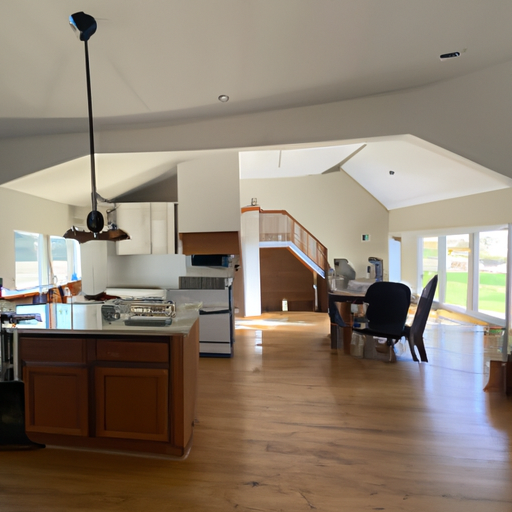

===== PROPERTY 5 =====
Neighborhood: Hilltop Heights
Price: $750000.0
Bedrooms: 4
Bathrooms: 3
Property Size: 2300

Description: Modern 4-bedroom, 3-bathroom hilltop home in the desirable Hilltop Heights neighborhood. This contemporary property features an open floor plan, high ceilings, and a rooftop deck with city views. Ideal for those seeking a stylish urban retreat with a spacious kitchen and cozy living room. The house also includes a backyard for gardening, a two-car garage, and a modern, energy-efficient heating system.

Neighborhood Description: Hilltop Heights offers a vibrant urban lifestyle with access to trendy restaurants, shops, and cultural attractions. Enjoy the convenience of city living in this dynamic neighborhood with good local schools, convenient shopping options, and easy access to a reliable bus line. The neighborhood also provides proximity to a major highway and bike-friendly roads, striking a balance between suburban tranquility and urban amenities like rest

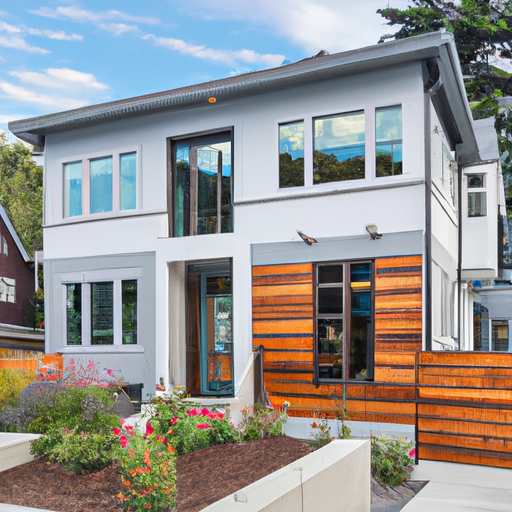

In [90]:
from IPython.display import display
from PIL import Image
import io

def display_new_listings(personalized_listings: List[PropertyListing]):
    print("Greetings! Based on your preferences, here are some properties we think you would enjoy:")
    # Clear previous listing.txt.
    with open('listing.txt', 'w') as outfile:
        # This truncates the file
        pass
    with open('listing.txt', 'a') as outfile:
        for idx, listing in enumerate(personalized_listings, start=1):
            property = f"""===== PROPERTY {idx} =====
Neighborhood: {listing.neighborhood}
Price: ${listing.price}
Bedrooms: {listing.bedrooms}
Bathrooms: {listing.bathrooms}
Property Size: {listing.size}

Description: {listing.description}

Neighborhood Description: {listing.neighborhood_description}
"""
            print(property)
            outfile.write(f"{property}\n")

            img_bytes = io.BytesIO(listing.image)
            image = Image.open(img_bytes)
            display(image)

# Buyer 1's personalized listings
display_new_listings(personalized_listings)

## Maintaining Factual Integrity

The LLM struggled to maintain the number of bedrooms when modifying the description, so I wrote regex to replace the new number of bedrooms with the old number of bedrooms if they were different.  I did the same for number of bathrooms.

All other descriptions have significantly improved per the buyer's preferences.

# Step 7: Deliverables and Testing

## Test "HomeMatch"

Greetings! Based on your preferences, here are some properties we think you would enjoy:
===== PROPERTY 1 =====
Neighborhood: Riverfront Estates
Price: $1050000.0
Bedrooms: 6
Bathrooms: 5
Property Size: 4000

Description: Comfortable 6-bedroom, 5-bathroom waterfront home in the prestigious Riverfront Estates community. This elegant property features a private dock, panoramic river views, a wine cellar, and a home gym. Perfect for those seeking luxury living on the water. The house also includes a spacious kitchen, cozy living room, backyard for gardening, two-car garage, and a modern, energy-efficient heating system.

Neighborhood Description: Riverfront Estates offers a tranquil setting with access to boating, fishing, and waterfront dining. Experience the beauty of riverfront living in this exclusive enclave. The neighborhood also boasts good local schools, convenient shopping options, easy access to a reliable bus line, proximity to a major highway, and bike-friendly roads. It strik

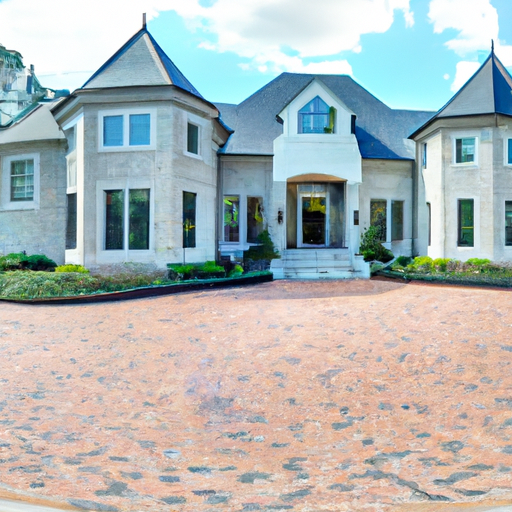

===== PROPERTY 2 =====
Neighborhood: Harbor Pointe
Price: $680000.0
Bedrooms: 3
Bathrooms: 2
Property Size: 1800

Description: Stylish 3-bedroom, 2-bathroom townhouse in the desirable Harbor Pointe community. This home boasts an open floor plan, designer finishes, and a rooftop terrace with serene water views. Perfect for those seeking a comfortable living space with a spacious kitchen and cozy living room.

Neighborhood Description: Harbor Pointe offers a tranquil waterfront lifestyle with marinas, restaurants, and scenic walking paths along the harbor. Enjoy the beauty of coastal living while being conveniently located near good local schools, shopping options, and easy access to urban amenities like restaurants and theaters.



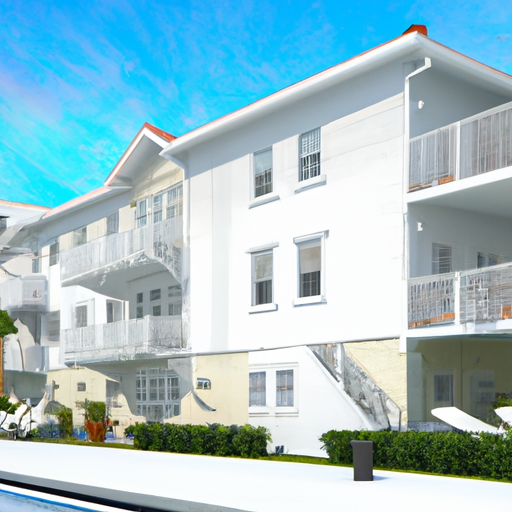

===== PROPERTY 3 =====
Neighborhood: Pinecrest Meadows
Price: $780000.0
Bedrooms: 4
Bathrooms: 3
Property Size: 2200

Description: Inviting 4-bedroom, 3-bathroom ranch-style home in the peaceful Pinecrest Meadows neighborhood. This charming property features a spacious kitchen, cozy living room, sunroom, hardwood floors, and a large backyard perfect for gardening. Complete with a two-car garage and a modern, energy-efficient heating system, this home offers a tranquil retreat for those seeking suburban tranquility. Conveniently located near good local schools, shopping options, a reliable bus line, and bike-friendly roads. Enjoy the balance between suburban tranquility and access to urban amenities like restaurants and theaters.

Neighborhood Description: Pinecrest Meadows is a quiet community surrounded by nature trails, parks, and wildlife. Residents can enjoy a serene lifestyle with easy access to major highways, making commuting a breeze. The neighborhood is also in close proximity

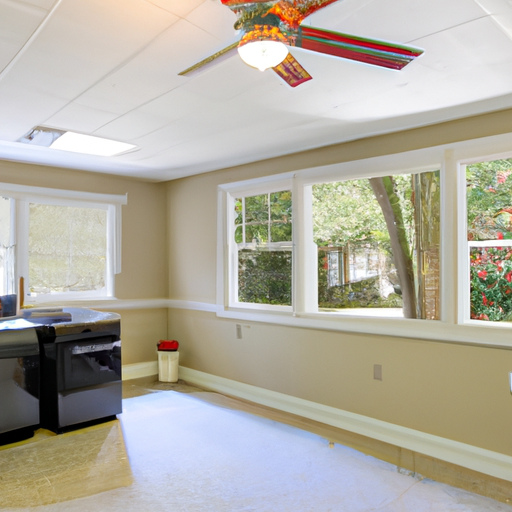

===== PROPERTY 4 =====
Neighborhood: Lakeview Heights
Price: $720000.0
Bedrooms: 3
Bathrooms: 2
Property Size: 2000

Description: Charming 3-bedroom, 2-bathroom cottage in the desirable Lakeview Heights neighborhood. This cozy home features a fireplace, hardwood floors, and a private backyard with a deck. Enjoy peaceful living with stunning lake views. The house boasts a spacious kitchen and a cozy living room, perfect for relaxing or entertaining guests. The backyard is ideal for gardening, and the two-car garage provides ample storage space. Stay comfortable with the modern, energy-efficient heating system.

Neighborhood Description: Lakeview Heights offers a serene setting with access to hiking trails, parks, and a vibrant community atmosphere. The neighborhood is known for its good local schools and convenient shopping options. Enjoy easy access to a reliable bus line, proximity to a major highway, and bike-friendly roads. Experience a balance between suburban tranquility and acces

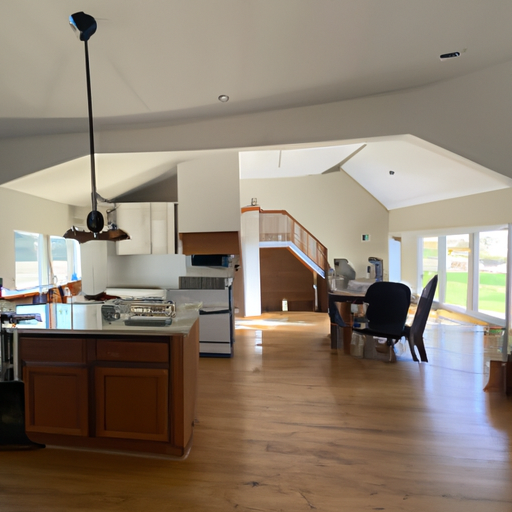

===== PROPERTY 5 =====
Neighborhood: Hilltop Heights
Price: $750000.0
Bedrooms: 4
Bathrooms: 3
Property Size: 2300

Description: Modern 4-bedroom, 3-bathroom hilltop home in the desirable Hilltop Heights neighborhood. This contemporary property features an open floor plan, high ceilings, and a rooftop deck with city views. Ideal for those seeking a stylish urban retreat with a comfortable three-bedroom house, spacious kitchen, and cozy living room. The backyard is perfect for gardening, and there is a two-car garage for convenience. The house also boasts a modern, energy-efficient heating system.

Neighborhood Description: Hilltop Heights offers a vibrant urban lifestyle with access to trendy restaurants, shops, and cultural attractions. Enjoy the convenience of city living in this dynamic neighborhood, while also benefiting from a quiet atmosphere, good local schools, and convenient shopping options. The neighborhood provides easy access to a reliable bus line, proximity to a major hi

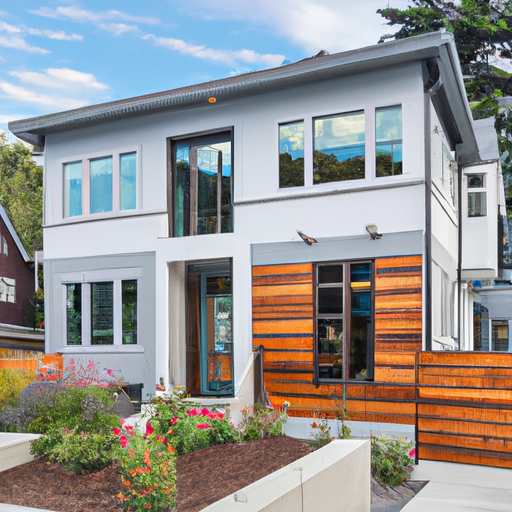

In [91]:
buyer2_preferences = [
    "A comfortable four-bedroom house with water nearby.",
    "Good local schools, and convenient shopping options.",
    "Easy access to a public transportation."
]

personalized_listings = generate_personalized_listings(buyer2_preferences)

display_new_listings(personalized_listings)